In [106]:
import pandas as pd
import numpy as np
from scipy import stats

import pymc as pm
import arviz as az

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from bazaraki_parser import run_updates
from linear_model_pooled import CarPrices

%matplotlib inline
%config InlineBackend.figure_format='retina'
pd.options.mode.chained_assignment = None

In [107]:
# Run this cell if you want to update datasets
# run_updates(['mazda'], ['mazda-2', 'mazda-demio'], 'data//df_demio_new.csv', 'data//df_demio.csv')

## Read data and EDA

In [167]:
df = pd.read_csv('data//df_demio_clean.csv')

In [168]:
df.sample(6)

,brand,model,year,mileage_km,price_eur,fuel_type,gear_box,engine_size,ref
126,Mazda,Demio,2019.0,41123.0,14500.0,1,0,1.5,https://www.bazaraki.com/adv/4720713_mazda-dem...
165,Mazda,Demio,2011.0,216000.0,7250.0,0,0,1.3,https://www.bazaraki.com/adv/4807910_mazda-dem...
79,Mazda,Demio,2012.0,188000.0,7500.0,0,0,1.3,https://www.bazaraki.com/adv/4827253_mazda-dem...
261,Mazda,2,2020.0,24000.0,14500.0,0,0,1.5,https://www.bazaraki.com/adv/4735751_mazda-2-1...
272,Mazda,Demio,2018.0,71000.0,12600.0,0,0,1.3,https://www.bazaraki.com/adv/4842633_mazda-dem...
303,Mazda,2,2021.0,65400.0,12700.0,0,0,1.5,https://www.bazaraki.com/adv/4854014_mazda-2-1...


In [169]:
df.shape

(401, 9)

In [170]:
selections = [(df['year']<2002.0),
              (df['year']>=2002.0)&(df['year']<2007.0),
              (df['year']>=2007.0)&(df['year']<2015.0),
              (df['year']>=2015.0)
             ]
choices = ['gen_1',
           'gen_2', 
           'gen_3', 
           'gen_4'
          ]
df['design'] = np.select(selections, choices)

In [171]:
df = df[(df['mileage_km']>50)&(df['mileage_km']<400000)]

In [172]:
df.shape

(398, 10)

In [173]:
df.describe()

,year,mileage_km,price_eur,fuel_type,gear_box,engine_size
count,398.000000,398.000000,398.000000,398.000000,398.000000,398.000000
mean,2016.768844,70182.140704,12332.741206,0.148241,0.085427,1.435678
std,4.645285,54352.380516,3548.961347,0.355786,0.279868,0.129262
min,1996.000000,828.000000,1200.000000,0.000000,0.000000,0.000000
25%,2016.000000,31000.000000,11500.000000,0.000000,0.000000,1.300000
50%,2019.000000,56000.000000,13500.000000,0.000000,0.000000,1.500000
75%,2019.000000,86450.000000,14575.000000,0.000000,0.000000,1.500000
max,2022.000000,280000.000000,18900.000000,1.000000,1.000000,2.500000


In [174]:
df['design'].value_counts()

gen_4    322
gen_3     57
gen_2     12
gen_1      7
Name: design, dtype: int64

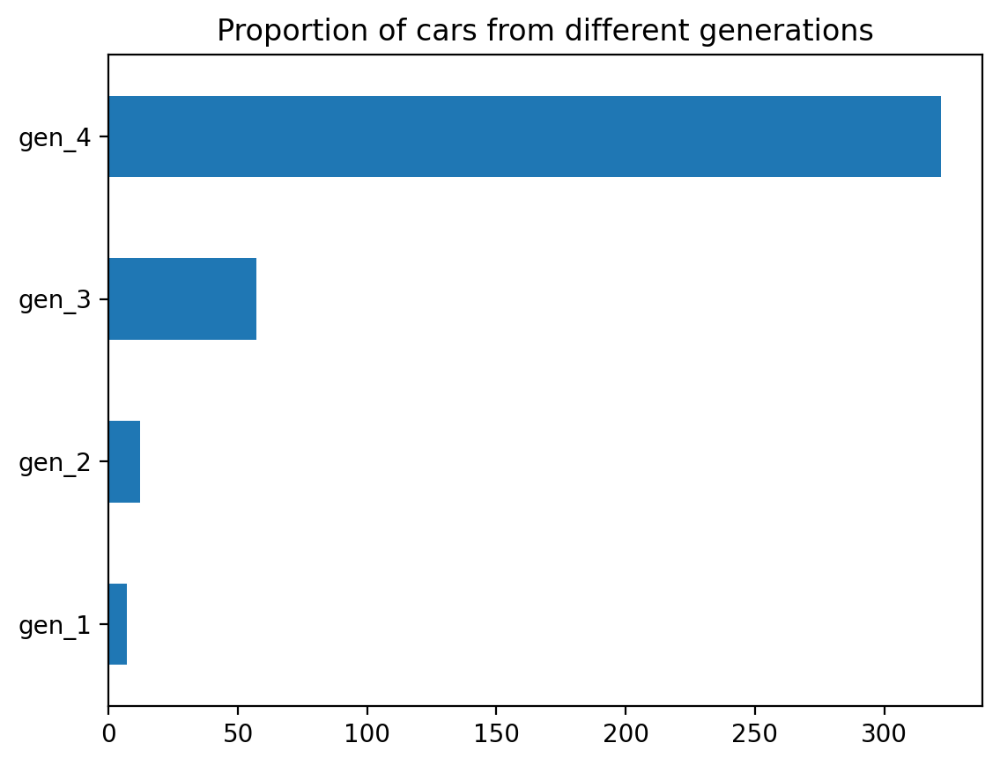

In [175]:
df['design'].value_counts().sort_values(ascending=True).plot(kind='barh')
plt.title('Proportion of cars from different generations');

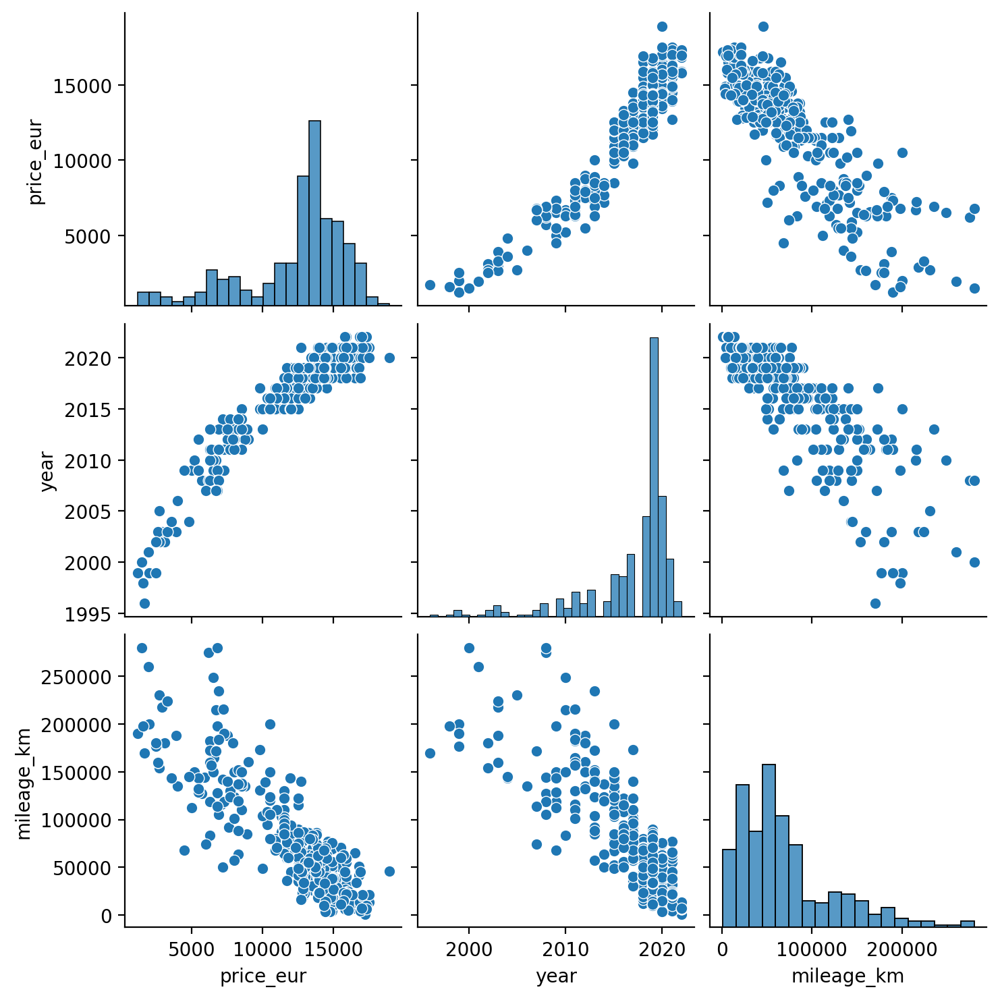

In [176]:
sns.pairplot(df[['price_eur','year', 'mileage_km']]);

## Preprocessing

In [177]:
df['price_eur_sqrt'] = np.sqrt(df['price_eur'])

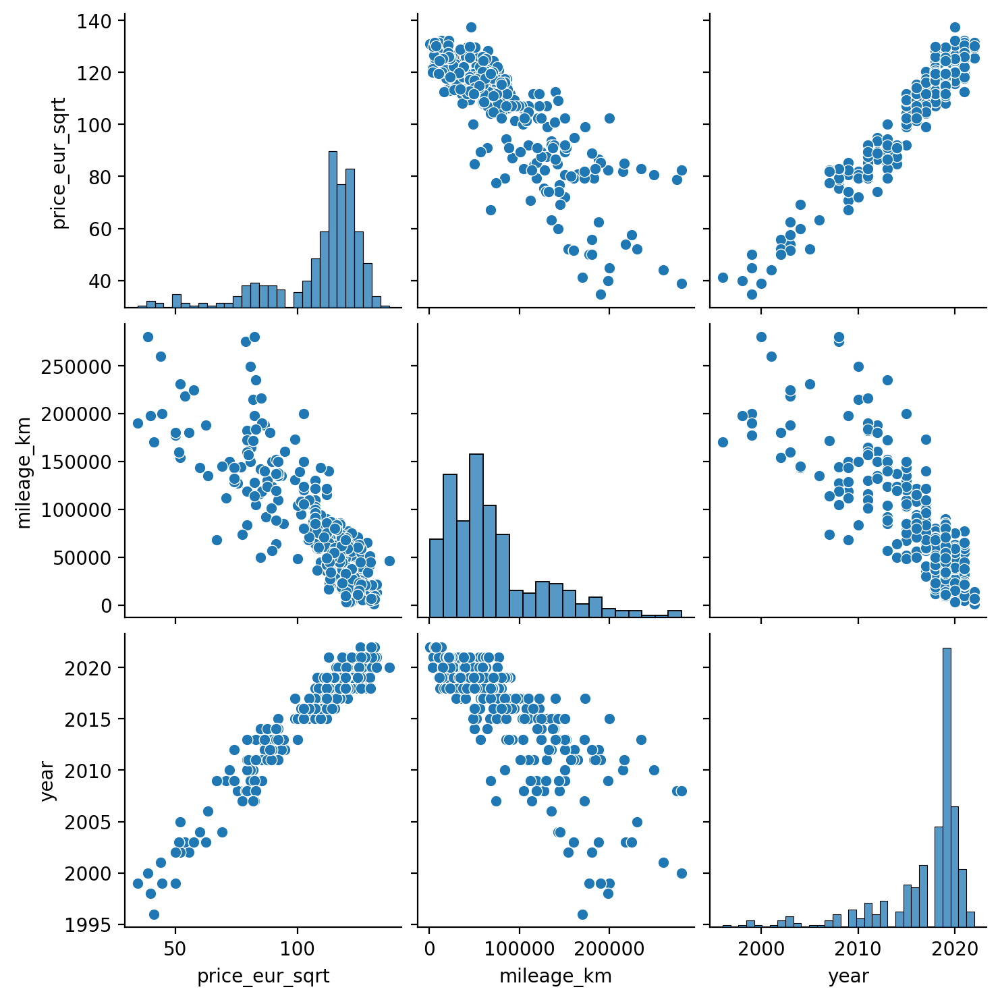

In [178]:
sns.pairplot(df[['price_eur_sqrt','mileage_km','year']]);

In [179]:
df[['price_eur_sqrt','mileage_km','year']].corr()

,price_eur_sqrt,mileage_km,year
price_eur_sqrt,1.000000,-0.846680,0.961722
mileage_km,-0.846680,1.000000,-0.826374
year,0.961722,-0.826374,1.000000


In [161]:
design_filter = df['design'].isin(df['design'].unique())
design_filter_g2 = df['design'].isin(['gen_2'])
design_filter_g4 = df['design'].isin(['gen_4'])
df_all = df.loc[design_filter, :]
df_gen_2 = df.loc[design_filter_g2, :]
df_gen_4 = df.loc[design_filter_g4, :]

## Prior for intercept

In [122]:
x_beta = np.linspace(0, 1, 10000)
y_beta = stats.beta.pdf(x_beta, a=1.5, b=6)
x_norm = np.linspace(-0.5, 1.5, 10000)
y_norm = stats.norm.pdf(x_norm, loc=0.5, scale=0.25)

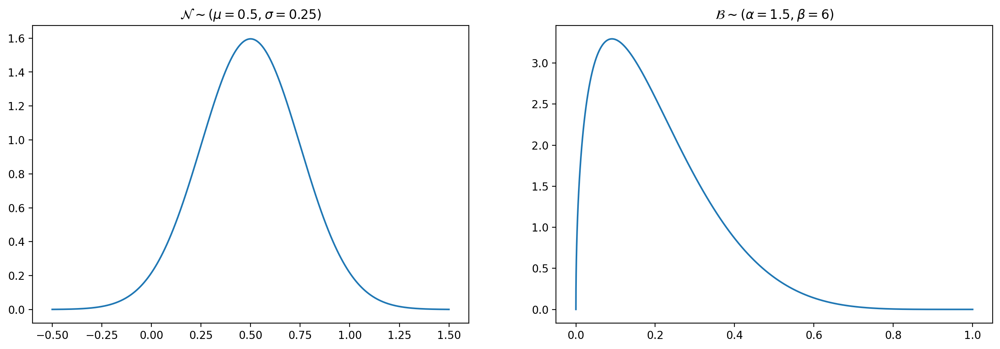

In [123]:
_, ax = plt.subplots(1,2, figsize=(16,5))
ax[0].plot(x_norm, y_norm)
ax[1].plot(x_beta, y_beta)
ax[0].set_title("$\mathcal{N} \sim (\mu =0.5, \sigma = 0.25)$")
ax[1].set_title("$\mathcal{B} \sim ( \\alpha = 1.5, \\beta = 6)$");

## Pooled model

In [124]:
df_model_g2 = df_gen_2[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box', 'price_eur_sqrt']]

In [125]:
gen_2 = CarPrices(666)
gen_2.fit(df_model_g2, 0.1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, β, ε]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 25 seconds.


CarPrices(seed=666)

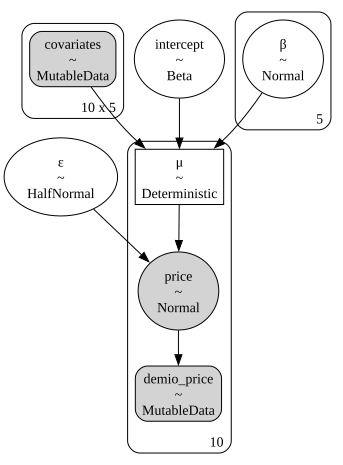

In [126]:
pm.model_to_graphviz(gen_2.demio_multiple)

## Model diagnostics

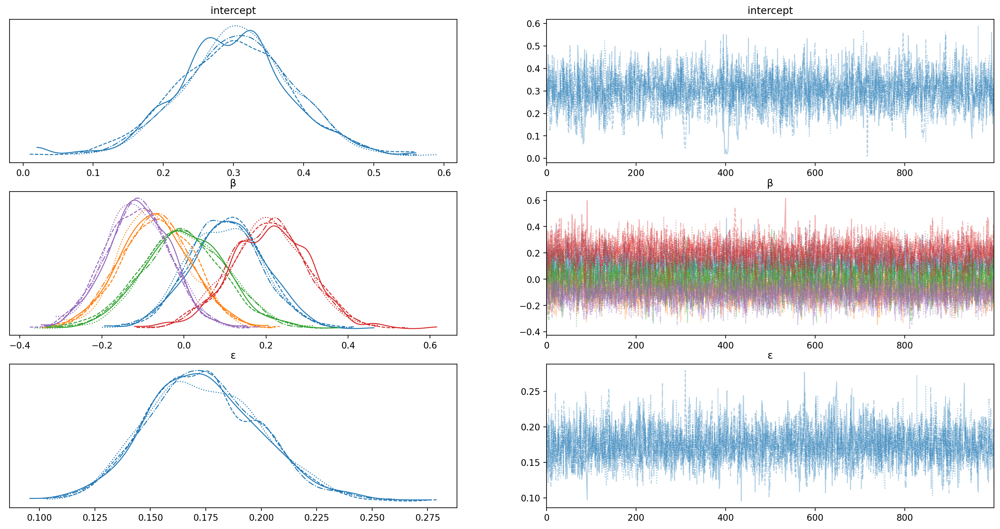

In [127]:
az.plot_trace(gen_2.trace_demio_oos, var_names=['intercept','β','ε'], figsize=(20,10));

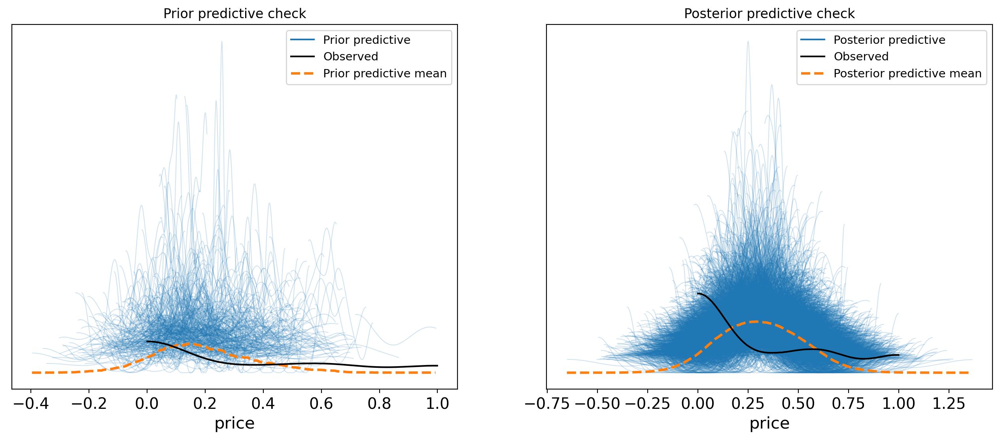

In [128]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_ppc(gen_2.trace_demio_oos, legend=True, group='prior', ax=axes[0])
axes[0].set_xlabel('price')
axes[0].set_title('Prior predictive check')

az.plot_ppc(gen_2.trace_demio_oos, legend=True, ax=axes[1])
axes[1].set_xlabel('price')
axes[1].set_title('Posterior predictive check');

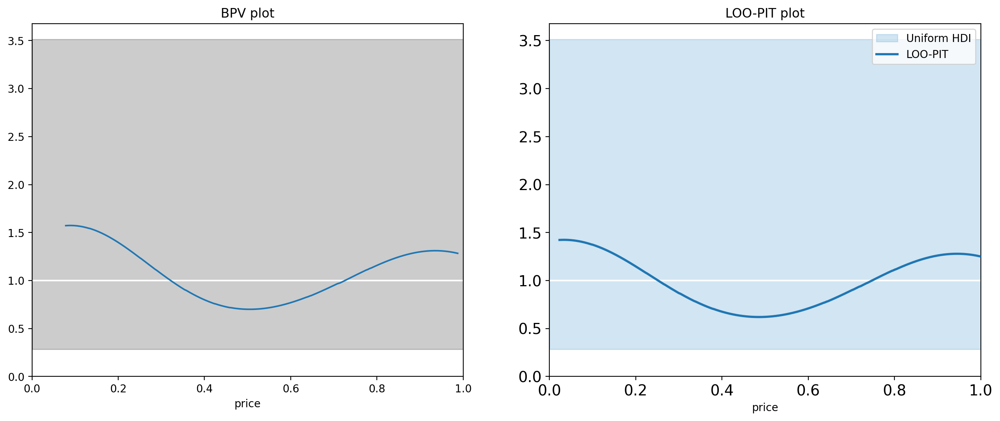

In [129]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_bpv(gen_2.trace_demio_oos, kind='u_value', ax=axes[0])
az.plot_loo_pit(gen_2.trace_demio_oos, y='price', use_hdi=True, ax=axes[1])
axes[0].set_title('BPV plot')
axes[1].set_title('LOO-PIT plot')
axes[0].set_xlabel('price')
axes[1].set_xlabel('price');


## Test set validation

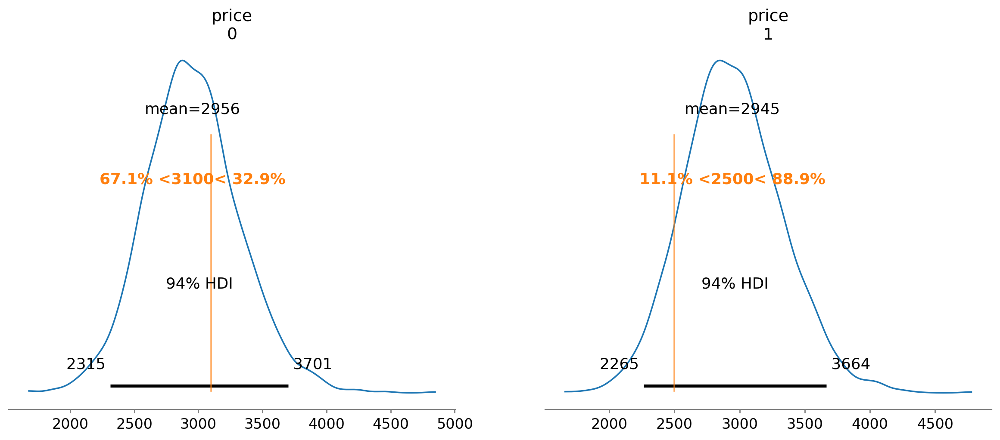

In [130]:
gen_2.check_on_test(gen_2.df_test);

## Train set validation

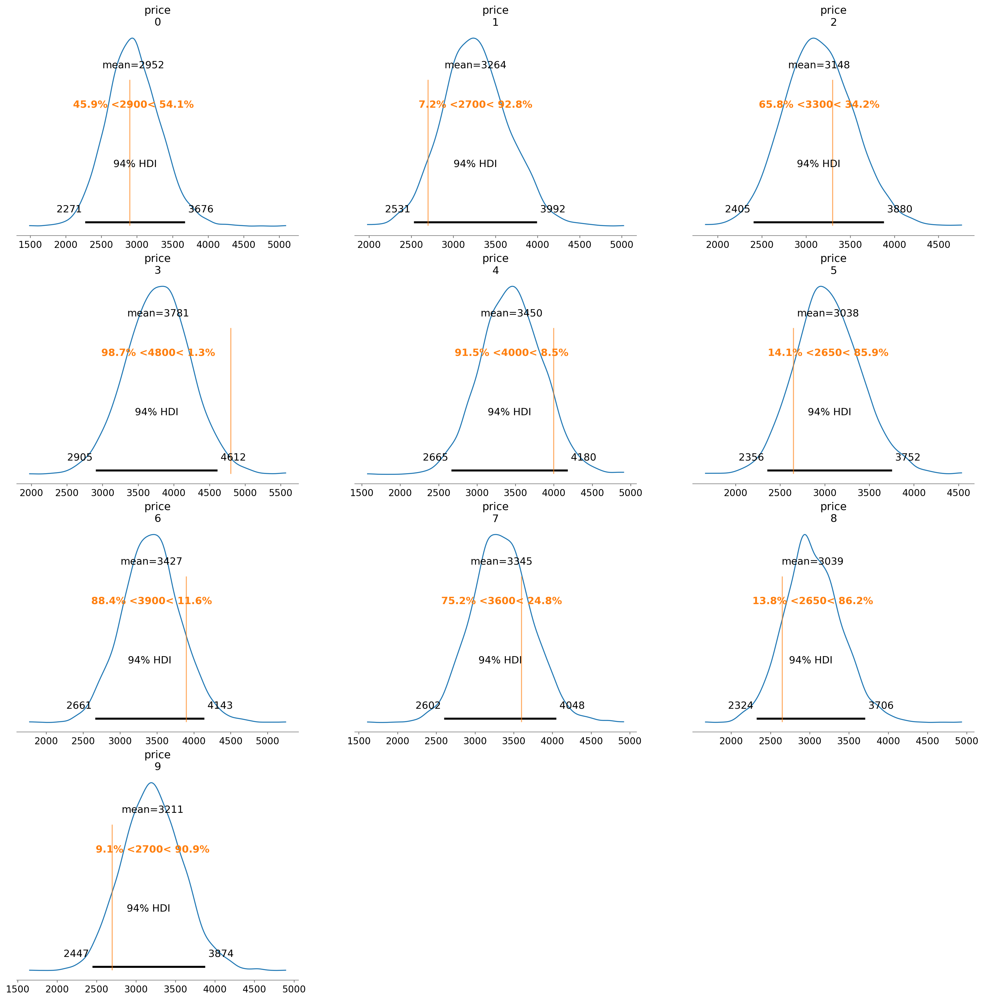

In [131]:
gen_2.check_on_test(gen_2.df_train);

## Make predictions

In [132]:
preds = {
    'year': [2002], 
    'mileage_km': [187000],
    'fuel_type': [0], 
    'engine_size': [1.3],
    'gear_box': [0],
    'price_eur_sqrt':[0],
    # 'design': ['gen_1']
}
my_demio = pd.DataFrame(preds)

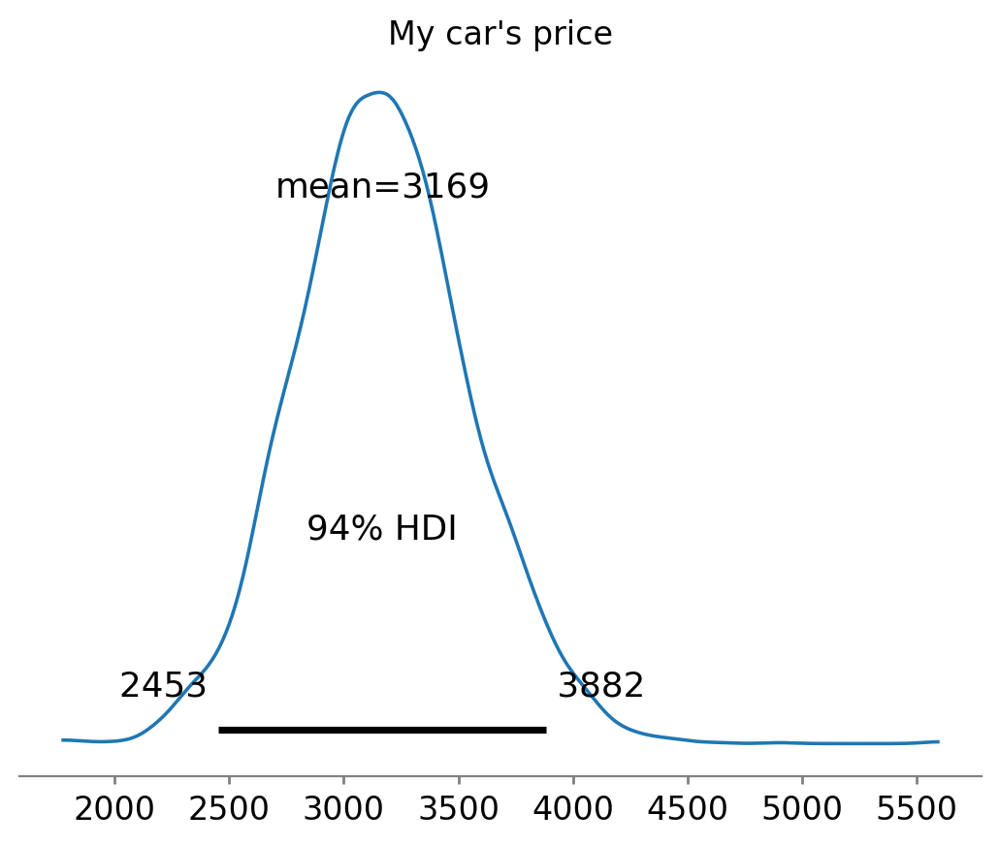

In [133]:
gen_2.make_predictions(my_demio, 'My car\'s price');

## Test set validation Generation 4

In [162]:
df_model_g4 = df_gen_4[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box', 'price_eur_sqrt']]

In [163]:
gen_4 = CarPrices(666)
gen_4.fit(df_model_g4, 0.1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, β, ε]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 33 seconds.


CarPrices(seed=666)

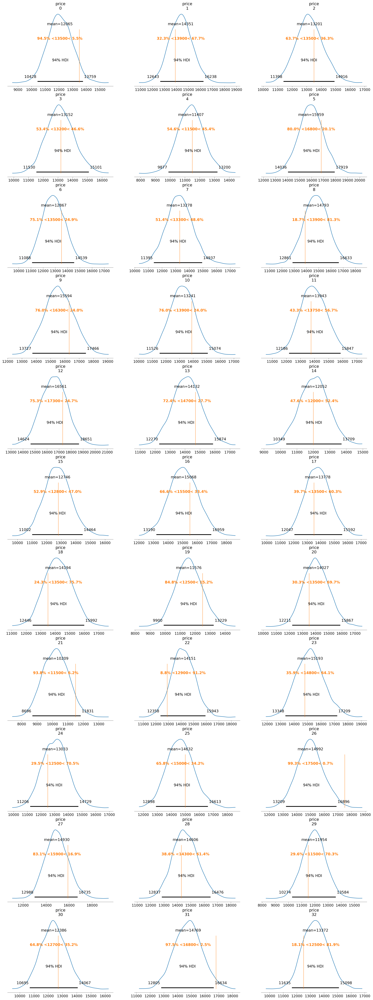

In [164]:
gen_4.check_on_test(gen_4.df_test);

## Pooled model all generations pooled

In [134]:
df_model_all = df_all[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box', 'price_eur_sqrt']]

In [135]:
gen_all = CarPrices(666)
gen_all.fit(df_model_all, 0.1)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, β, ε]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 57 seconds.


CarPrices(seed=666)

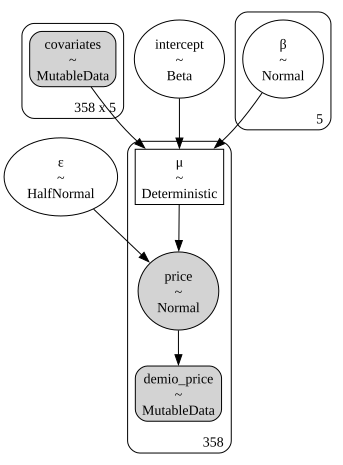

In [136]:
pm.model_to_graphviz(gen_all.demio_multiple)

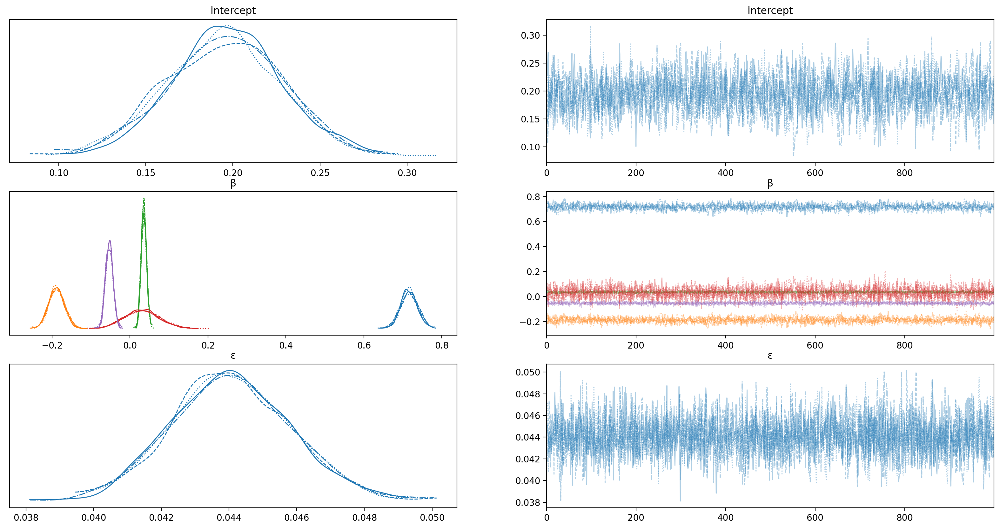

In [137]:
az.plot_trace(gen_all.trace_demio_oos, var_names=['intercept','β','ε'], figsize=(20,10));

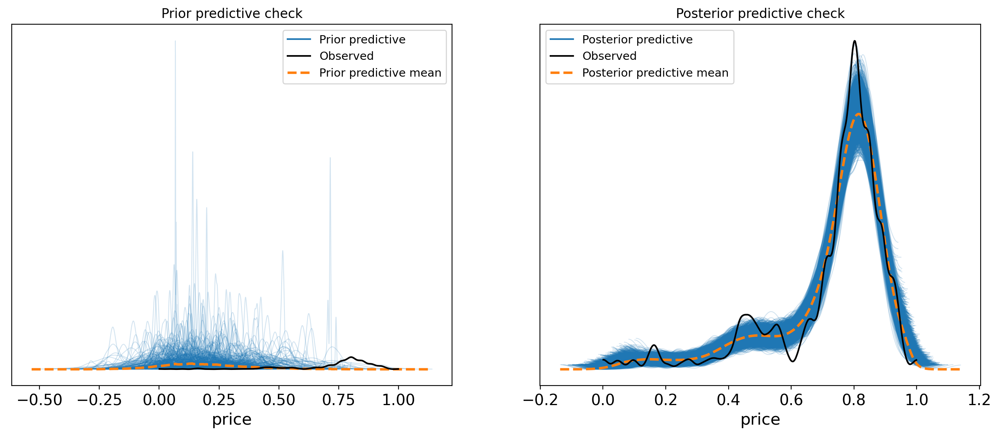

In [138]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_ppc(gen_all.trace_demio_oos, legend=True, group='prior', ax=axes[0])
axes[0].set_xlabel('price')
axes[0].set_title('Prior predictive check')

az.plot_ppc(gen_all.trace_demio_oos, legend=True, ax=axes[1])
axes[1].set_xlabel('price')
axes[1].set_title('Posterior predictive check');

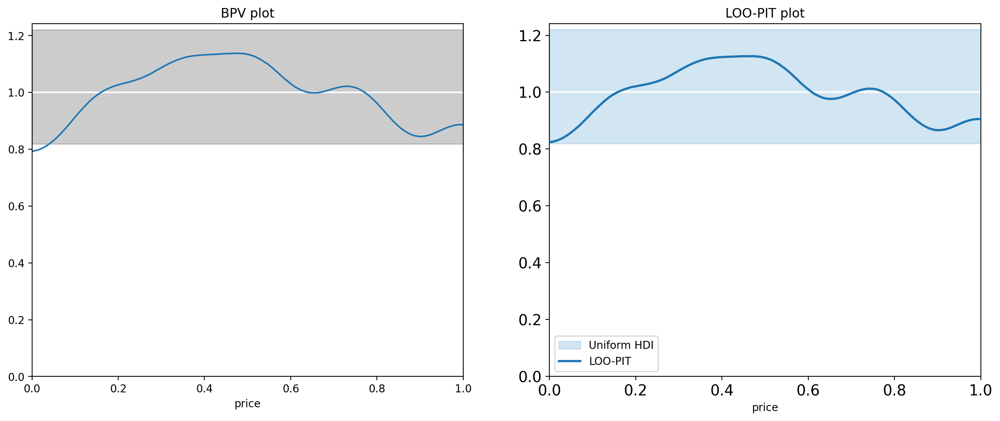

In [139]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_bpv(gen_all.trace_demio_oos, kind='u_value', ax=axes[0])
az.plot_loo_pit(gen_all.trace_demio_oos, y='price', use_hdi=True, ax=axes[1])
axes[0].set_title('BPV plot')
axes[1].set_title('LOO-PIT plot')
axes[0].set_xlabel('price')
axes[1].set_xlabel('price');

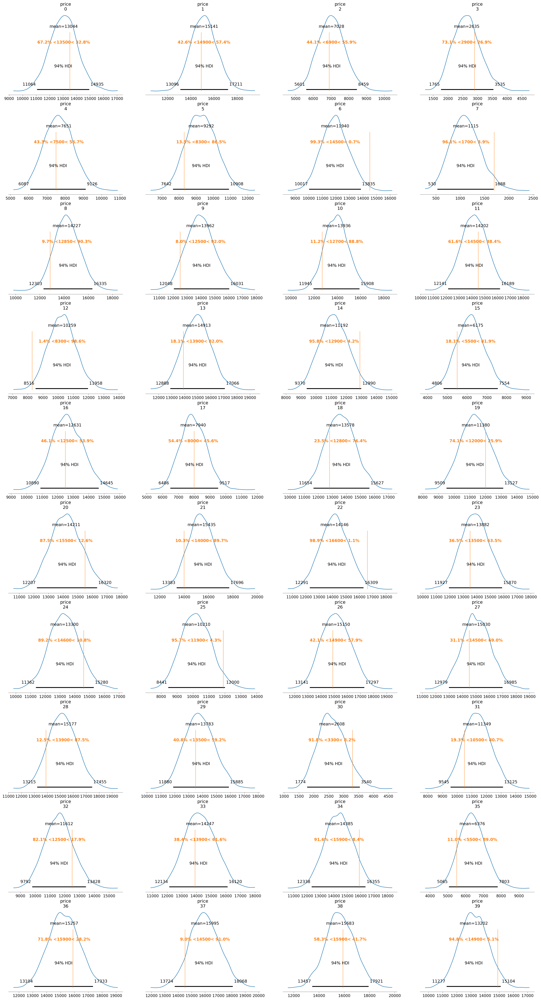

In [140]:
gen_all.check_on_test(gen_all.df_test);

## Unpooled model

In [141]:
df_model_unpooled = df[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box', 'price_eur_sqrt', 'design']]
df_train, df_test = train_test_split(df_model_unpooled, test_size=0.1, random_state=666)

In [142]:
scaler = MinMaxScaler()
scaler.fit(df_train.iloc[:,:-1])
df_train_scaled = df_train.copy()
df_train_scaled.iloc[:,:-1] = scaler.transform(df_train.iloc[:,:-1])
df_test_scaled = df_test.copy()
df_test_scaled.iloc[:,:-1] = scaler.transform(df_test.iloc[:,:-1])

In [143]:
design_df = pd.Categorical(df_train_scaled['design'])
design_idx = design_df.codes
design = design_df.categories
coords = {
    'designs': design,
    'slopes': ['year', 'meleage', 'fuel', 'gear_box', 'engine']
}

In [144]:
with pm.Model(coords=coords) as demio_multiple:
    
    # data
    demio_price = pm.MutableData('demio_price', df_train_scaled.price_eur_sqrt.values)
    X = pm.MutableData('X', df_train_scaled[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box']].values)
    desing_idx_ = pm.MutableData('design_idx', design_idx)
    
    # prior
    # intercept = pm.SkewNormal('intercept', mu=0, sigma=0.5, alpha=-1, dims='designs')
    intercept = pm.Beta('intercept', alpha=1.5, beta=6, dims='designs')
    # intercept = pm.Normal('intercept', mu=0, sigma=1, dims='designs')
    β = pm.Normal('β', mu=0, sigma=0.1, dims=('designs', 'slopes'))
    
    # linear regression
    μ = pm.Deterministic('μ',(
                                intercept[desing_idx_] 
                                + β[desing_idx_, 0] * X[:,0] 
                                + β[desing_idx_, 1] * X[:,1] 
                                + β[desing_idx_, 2] * X[:,2] 
                                + β[desing_idx_, 3] * X[:,3] 
                                + β[desing_idx_, 4] * X[:,4]
                            ))


    # observational noise
    ε = pm.HalfNormal('ε', 0.05, dims='designs')
    
    # likelihood
    price = pm.Normal('price', mu=μ, sigma=ε[desing_idx_], observed=demio_price)

In [145]:
with demio_multiple:
    
    trace_demio_oos = pm.sample(
        draws=1000, 
        tune=2000, 
        target_accept=0.90
    )
    
    trace_demio_oos.extend(pm.sample_prior_predictive())
    trace_demio_oos.extend(pm.sample_posterior_predictive(trace_demio_oos))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, β, ε]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 227 seconds.


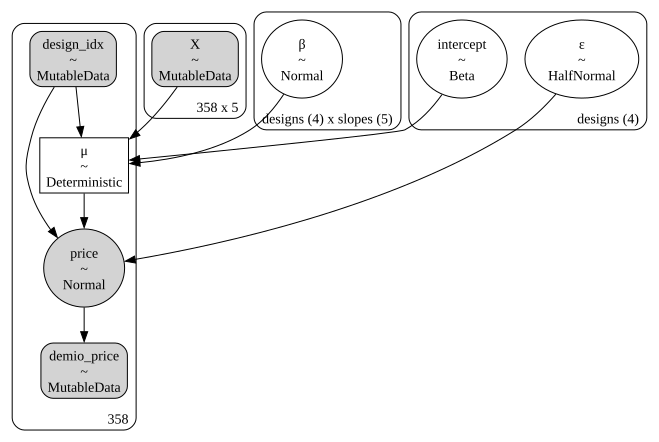

In [146]:
pm.model_to_graphviz(demio_multiple)

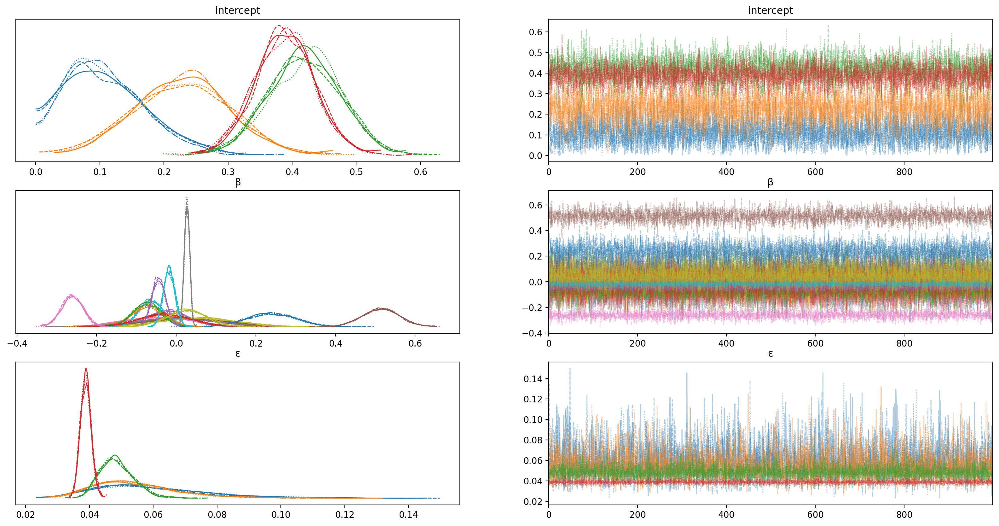

In [147]:
az.plot_trace(trace_demio_oos, var_names=['intercept','β','ε'], figsize=(20,10));

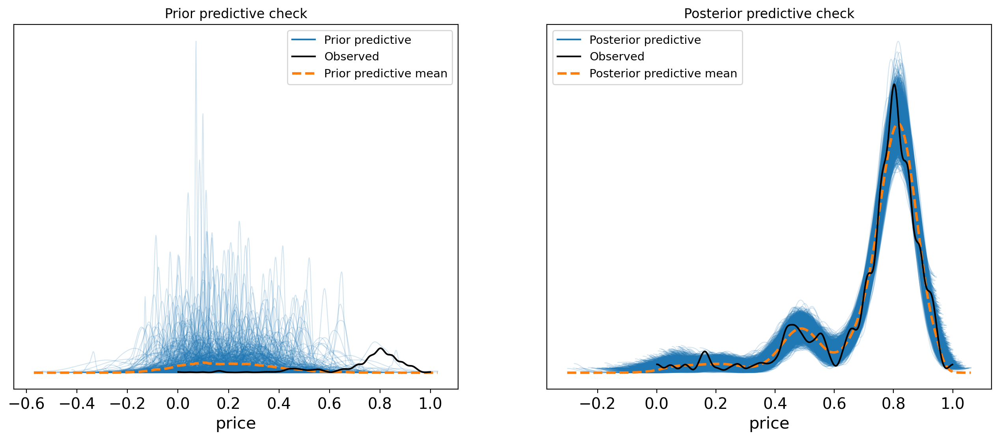

In [148]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_ppc(trace_demio_oos, legend=True, group='prior', ax=axes[0])
axes[0].set_xlabel('price')
axes[0].set_title('Prior predictive check')

az.plot_ppc(trace_demio_oos, legend=True, ax=axes[1])
axes[1].set_xlabel('price')
axes[1].set_title('Posterior predictive check');

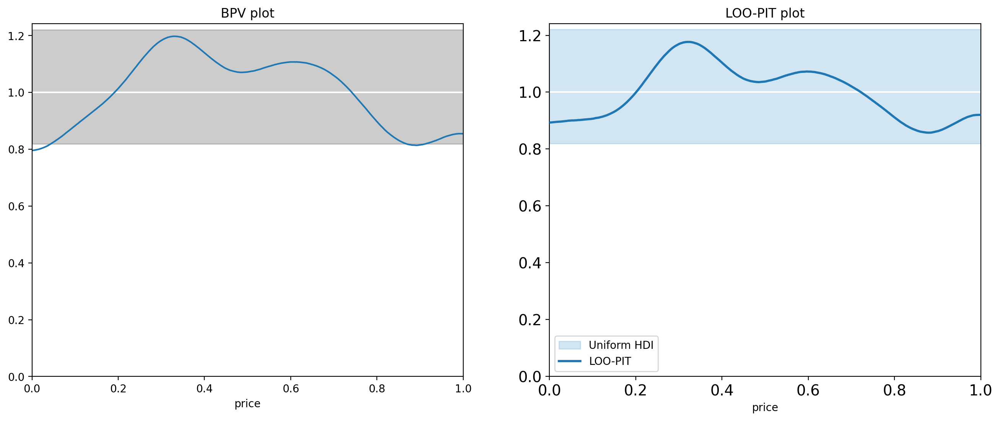

In [149]:
fig, axes = plt.subplots(1,2, figsize=(16, 6))

az.plot_bpv(trace_demio_oos, kind='u_value', ax=axes[0])
az.plot_loo_pit(trace_demio_oos, y='price', use_hdi=True, ax=axes[1])
axes[0].set_title('BPV plot')
axes[1].set_title('LOO-PIT plot')
axes[0].set_xlabel('price')
axes[1].set_xlabel('price');

In [150]:
name_to_idx_map = {name: index for index, name in pd.Series(design).to_dict().items()}
design_idx_test = df_test_scaled['design'].map(name_to_idx_map).values

In [151]:
with demio_multiple:

    pm.set_data(
        {
            'X': df_test_scaled[['year', 'mileage_km', 'fuel_type', 'engine_size', 'gear_box']].values,
            'design_idx': design_idx_test,
        }
    )


In [152]:
with demio_multiple:
    m = pm.sample_posterior_predictive(
        trace_demio_oos,
        predictions=True,
    )

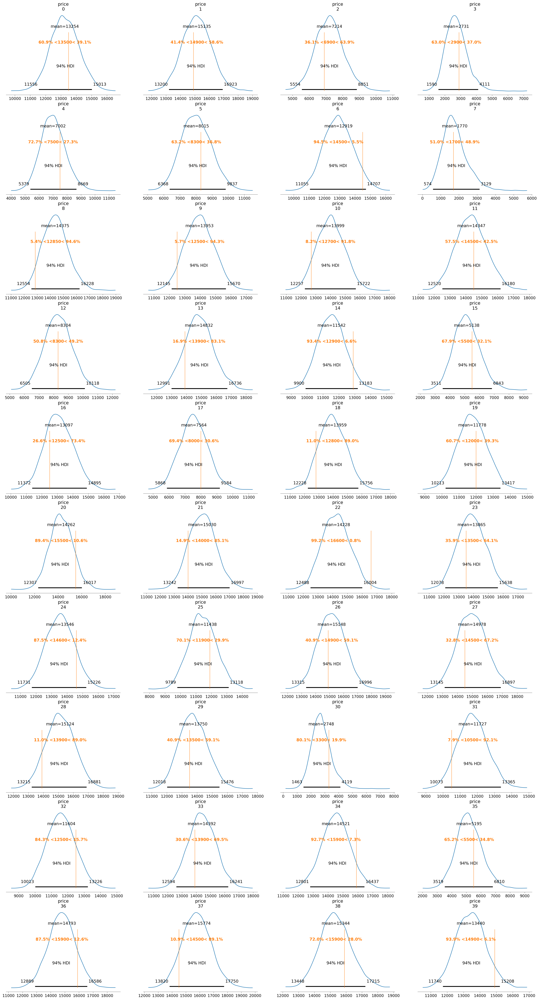

In [153]:
az.plot_posterior(
    (m.predictions['price'] *   scaler.data_range_[-1] + scaler.data_min_[-1]) ** 2,
    ref_val=(df_test['price_eur_sqrt'] ** 2).to_list(),
    hdi_prob=0.94,
    textsize=12,
);

## Model comparison

In [158]:
mask_unpooled = df_train['design'] == 'gen_2'

In [159]:
mask_gen_all = gen_all.df_train.index.isin(df_model[df_model['design'] == 'gen_2'].index)

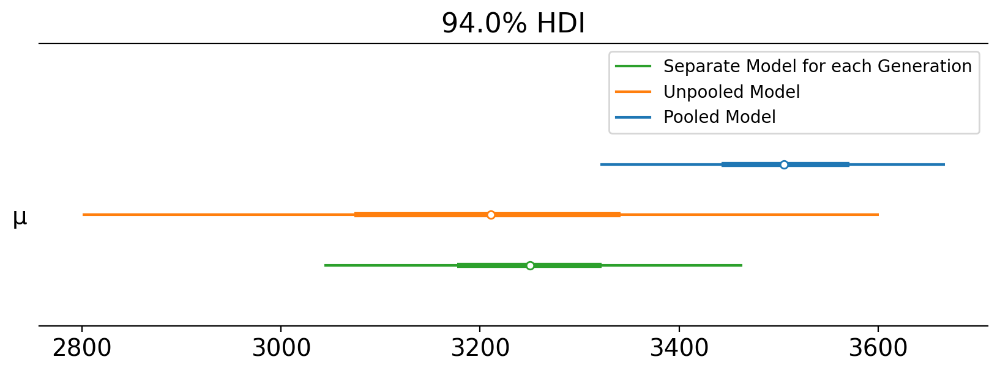

In [160]:
az.plot_forest(
    [(gen_all.trace_demio_oos.posterior['μ'][:,:,mask_gen_all] * gen_all.scaler.data_range_[-1] + gen_all.scaler.data_min_[-1]).mean(axis=2)**2, 
     (trace_demio_oos.posterior['μ'][:,:,mask_unpooled] * scaler.data_range_[-1] + scaler.data_min_[-1]).mean(axis=2)**2,
     (gen_2.trace_demio_oos.posterior['μ'] * gen_2.scaler.data_range_[-1] + gen_2.scaler.data_min_[-1]).mean(axis=2)**2,
    ],
    model_names=["Pooled Model", "Unpooled Model", "Separate Model for each Generation"],
    # var_names=["μ"], 
    combined=True, 
    figsize=(10,3));